In [1]:
# Importation des librairies
from netCDF4 import Dataset
import numpy as np
import os as os
from mpl_toolkits.basemap import Basemap
import matplotlib.patheffects as PathEffects
import itertools
from itertools import chain
import matplotlib.gridspec as gridspec
import matplotlib.pyplot as plt
import pylab as p
from scipy.stats import skew, kurtosis
from matplotlib.transforms import Bbox
import sys
sys.path.insert(1, '../ERA')
from ERA_Fields import*  
Model = 'Plasim'
area = 'France'
lon_start = 0
lon_end = 128
lat_start = 0 # latitudes start from 90 degrees North Pole
lat_end = 22


Months1 = [0, 0, 0, 0, 0, 0, 30, 30, 30, 30, 30, 0, 0, 0] 
Tot_Mon1 = list(itertools.accumulate(Months1))

t2m = Plasim_Field('tas','ANO_tas','Temperature', Model, lat_start, lat_end, lon_start, lon_end)
#t2m = Plasim_Field('ts','ANO_ts','Temperature', Model, lat_start, lat_end, lon_start, lon_end)
zg500 = Plasim_Field('zg','ANO_zg500','500 mbar Geopotential', Model, lat_start, lat_end, lon_start, lon_end)
t2m.load_field('Data_Plasim/')
zg500.load_field('Data_Plasim/')
LON = t2m.LON
LAT = t2m.LAT

/tmp/ipykernel_27519/2403605470.py:16: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  m = Basemap(width=coords[2],height=coords[3],resolution='l',projection='aea',lat_ts=60,lat_0=coords[0],lon_0=coords[1])


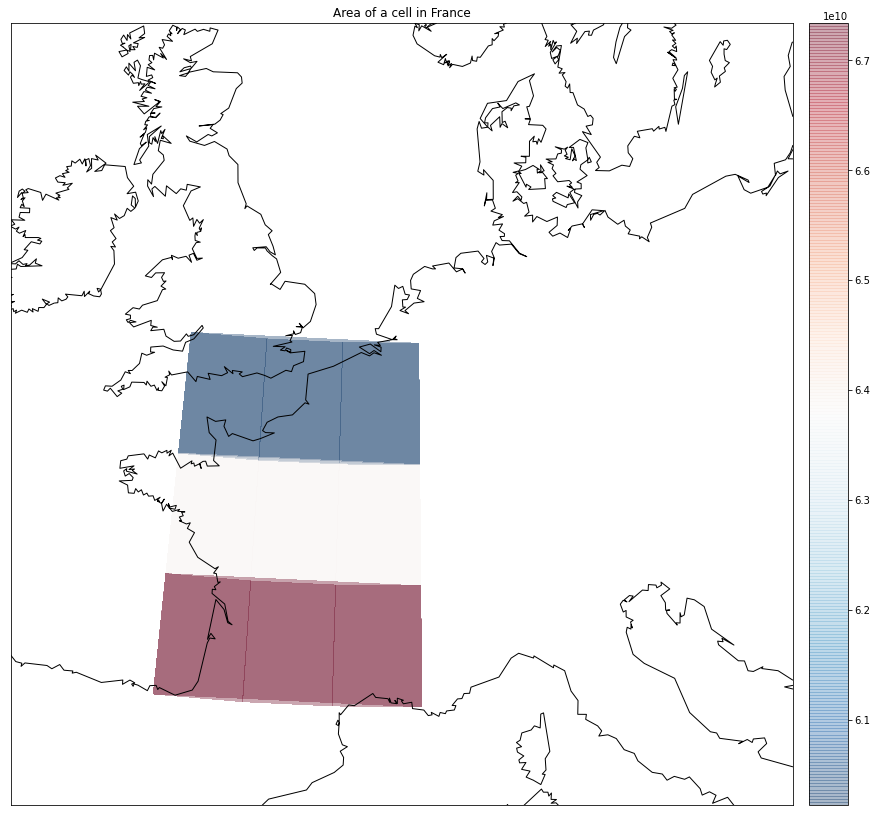

In [2]:
LON_mask = create_mask(Model,area,LON)
LAT_mask = create_mask(Model,area,LAT)
# Load the land area mask
dataset = Dataset('Data_Plasim_inter/CONTROL_lsmask.nc')
lsm = dataset.variables['lsm'][0]
dataset.close()
# Load the areas of each cell
dataset = Dataset('Data_Plasim_inter/CONTROL_gparea.nc')
cell_area = dataset.variables["cell_area"][:]
dataset.close()
mask_ocean = np.array(lsm)
mask_area = np.array(create_mask(Model,area, lsm))

coords = [50, 5., 2000000, 2000000]
fig = plt.figure(figsize=(15, 15), edgecolor='w')
m = Basemap(width=coords[2],height=coords[3],resolution='l',projection='aea',lat_ts=60,lat_0=coords[0],lon_0=coords[1])
m.pcolormesh(Greenwich(LON_mask), Greenwich(LAT_mask), Greenwich(create_mask(Model,area,cell_area)), latlon=True, alpha = .35, cmap='RdBu_r')
plt.title("Area of a cell in France")
m.colorbar()
m.drawcoastlines()
plt.show()

/tmp/ipykernel_27519/1401656546.py:3: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  m = Basemap(width=coords[2],height=coords[3],resolution='l',projection='aea',lat_ts=60,lat_0=coords[0],lon_0=coords[1])


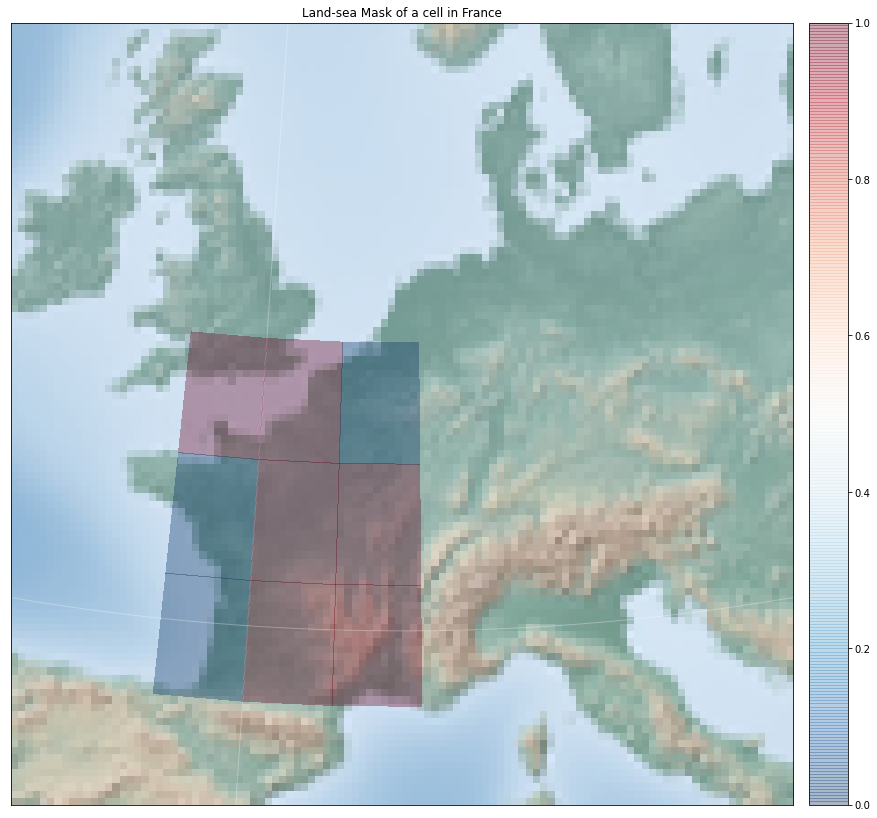

In [3]:
fig = plt.figure(figsize=(15, 15), edgecolor='w')
#m = Basemap(projection='nplaea',boundinglat=25,lon_0=0,resolution='c')
m = Basemap(width=coords[2],height=coords[3],resolution='l',projection='aea',lat_ts=60,lat_0=coords[0],lon_0=coords[1])
draw_map(m)
m.pcolormesh((LON_mask), (LAT_mask), (create_mask(Model,area,lsm)), latlon=True, alpha = .35, cmap='RdBu_r')
plt.title("Land-sea Mask of a cell in "+area)
m.colorbar()
plt.show()

In [4]:
mask = create_mask(Model,area,cell_area)*create_mask(Model,area,lsm)  
mask = mask/np.sum(np.sum(mask))  # Here I combine both grid-point area times the mask into a normalized mask
print(mask[-1,:])

[0.08987284333296675 0.08987284333296709 0.08987284333296704 0.0]


In [5]:
Tot_Mon1[5:9]

[0, 30, 60, 90]

mylon =  14.0625 , mylat =  46.044726631101675 , mylon_coor =  1699274.870070592 , mylat_coor =  602939.1433115646
0


/tmp/ipykernel_27519/1732187043.py:21: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  m = Basemap(projection='nplaea',boundinglat=30,lon_0=0,resolution='c')


30
60
90


<Figure size 2880x2880 with 0 Axes>

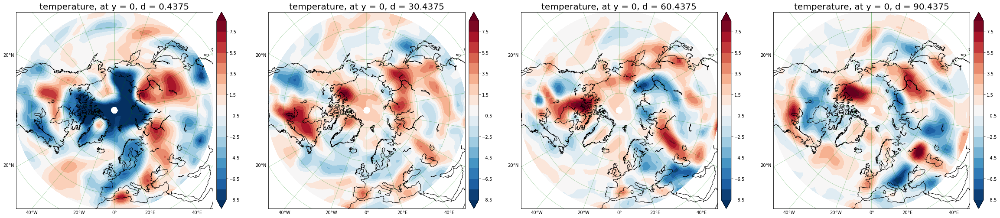

In [6]:
K = 273.15
y = 0
mylon_pixel = 5
mylat_pixel = 15
mylon = LON[mylat_pixel, mylon_pixel]
mylat = LAT[mylat_pixel, mylon_pixel]
mylon_coor, mylat_coor = m(mylon, mylat)
print("mylon = ",mylon,", mylat = ",mylat, ", mylon_coor = ",mylon_coor, ", mylat_coor = ", mylat_coor)

t2m.levels = np.linspace(-8.5, 8.5, 18)  # Levels to be used when plotting
zg500.levels = np.concatenate((np.arange(-10 * 20, 0, 10), np.arange(10, 10 * 21, 10))) 
fig2 = plt.figure(figsize=(40, 40))
spec2 = gridspec.GridSpec(ncols=4, nrows=1, figure=fig2)
iterate = 0
ax = []
fig2 = plt.figure(figsize=(40, 10))
for i,subplt in zip(Tot_Mon1[5:9],['141','142','143','144']):
    ax.append(fig2.add_subplot(spec2[0,iterate]))
    iterate = iterate + 1
    print(i)
    m = Basemap(projection='nplaea',boundinglat=30,lon_0=0,resolution='c')
    geo_contourf(m, ax[iterate-1], 0, Greenwich(LON), Greenwich(LAT), Greenwich(t2m.var[y,i,:,:]), t2m.levels, "RdBu_r", "temperature, at y = " + str(y)+", d = "+str(t2m.time[y,i]))
    #geo_contour(m, ax[iterate-1], 0, Greenwich(LON), Greenwich(LAT), Greenwich(zg500.var[y,i,:,:]), zg500.levels, "PuRd", "summer")
  

In [7]:
t2m.abs_area_int, t2m.ano_area_int = t2m.Set_area_integral(area,mask)
zg500.abs_area_int, zg500.ano_area_int = zg500.Set_area_integral(area,mask)

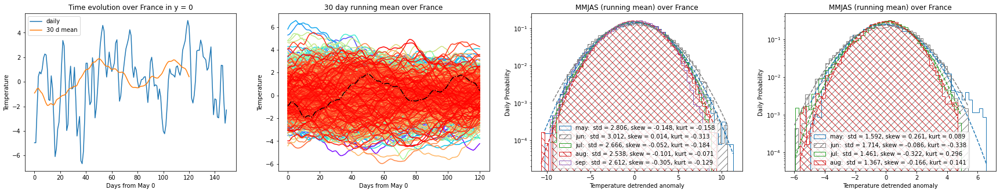

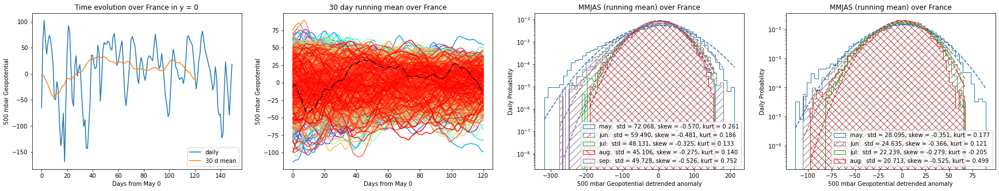

In [8]:
np.save('Postproc/'+Model+'_'+area+'_t2m', t2m.abs_area_int )
convseq = np.ones(30)/30
mycolors = ["tab:blue", "tab:gray", "tab:green", "tab:red", "tab:purple"]   # these colors are used to distinguish the months
monthhatches = ["","//","","\\\\",""]
mymonth = ["may", "jun", "jul", "aug", "sep"]
mylinewidth = [1, 1, 1, 1, 1]    # summer months should be more visible

for myfield in [t2m, zg500]:
    myyear = 0
    PltDistHist(myfield, convseq, mycolors, monthhatches, mymonth, mylinewidth, myyear, Tot_Mon1,area)

A.shape =  (1000, 77)
np.std(A) =  1.829661604520203
76 76


../ERA/ERA_Fields.py:791: UserWarning: a_max_and_ti_postproc: adjusting length
  warnings.warn('a_max_and_ti_postproc: adjusting length')
../ERA/ERA_Fields.py:763: RuntimeWarning: divide by zero encountered in log
  r1 = - 1/(np.log(1 - m/len(D_sorted))) # assumption of Poisson process


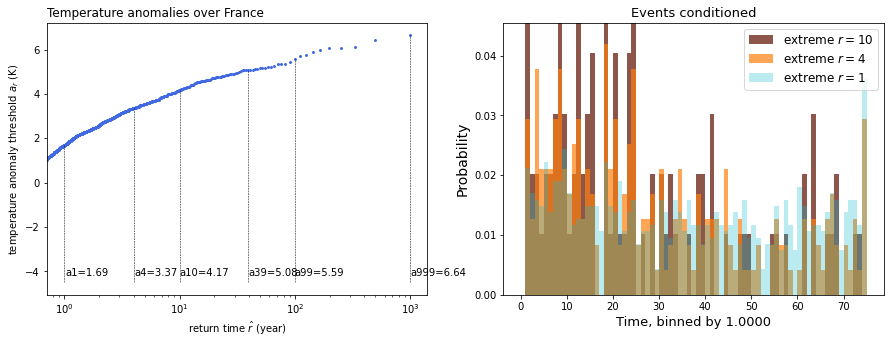

In [9]:
A = np.zeros((1000, Tot_Mon1[9] - Tot_Mon1[6] - 13))   # When we use convolve (running mean) there is an extra point that we can generate by displacing the window hence 13 instead of 14
convseq = np.ones(14)/14
for y in range(1000):
    A[y,:]=np.convolve(t2m.abs_area_int[y,(Tot_Mon1[6]):(Tot_Mon1[9])],  convseq, mode='valid')
print("A.shape = ", A.shape)
print("np.std(A) = ",np.std(A))
A_max, Ti, year_a = a_max_and_ti_postproc(A, A.shape[1])
year_a = range(1000)
A_max_sorted = a_decrese(A_max, Ti, year_a)
XX_rt, YY_rt, xx_rt, yy_rt = return_time_fix(A_max_sorted,'yes')
print(np.max(Ti),90-14)
figure = plt.figure(1, figsize=(15, 5))
ax1 = figure.add_subplot(121)
Ax = figure.add_subplot(122)
PltReturnsHist(XX_rt, YY_rt, xx_rt, yy_rt, A_max_sorted, Tot_Mon1,area,ax1,Ax)

In [10]:
A_max_sorted

[(6.641403487750462, [61, 978]),
 (6.408955999783107, [10, 384]),
 (6.120415312903267, [7, 313]),
 (6.066326005118234, [18, 165]),
 (6.061632990837097, [8, 225]),
 (5.970035655157906, [6, 98]),
 (5.891830827508653, [2, 296]),
 (5.735498309135437, [55, 790]),
 (5.718854665756226, [9, 884]),
 (5.589880211012704, [63, 996]),
 (5.434746578335762, [68, 962]),
 (5.368092281477791, [23, 349]),
 (5.365639890943255, [66, 659]),
 (5.341119068009512, [18, 849]),
 (5.238393251385007, [5, 490]),
 (5.233875700405665, [20, 821]),
 (5.2333754641669135, [24, 625]),
 (5.168316313198634, [15, 431]),
 (5.163931318691798, [7, 785]),
 (5.148717045783996, [72, 872]),
 (5.1324029309409, [38, 684]),
 (5.119562676974705, [57, 660]),
 (5.098078727722168, [30, 319]),
 (5.081741196768624, [1, 436]),
 (5.077169477939605, [5, 526]),
 (5.0718216214861185, [11, 126]),
 (5.055834923471723, [41, 653]),
 (5.055457632988691, [20, 728]),
 (5.051405940737043, [11, 351]),
 (4.976956273828234, [63, 299]),
 (4.9491444144930155

A.shape = (100, 86)
A.shape = (100, 86)
A.shape = (100, 86)
A.shape = (100, 86)
A.shape = (100, 86)
A.shape = (100, 86)
A.shape = (100, 86)
A.shape = (100, 86)
A.shape = (100, 86)
A.shape = (100, 86)
A.shape = (100, 77)
A.shape = (100, 77)
A.shape = (100, 77)
A.shape = (100, 77)
A.shape = (100, 77)
A.shape = (100, 77)
A.shape = (100, 77)
A.shape = (100, 77)
A.shape = (100, 77)
A.shape = (100, 77)
A.shape = (100, 61)
A.shape = (100, 61)
A.shape = (100, 61)
A.shape = (100, 61)
A.shape = (100, 61)
A.shape = (100, 61)
A.shape = (100, 61)
A.shape = (100, 61)
A.shape = (100, 61)
A.shape = (100, 61)
A.shape = (100, 1)
A.shape = (100, 1)
A.shape = (100, 1)
A.shape = (100, 1)
A.shape = (100, 1)
A.shape = (100, 1)
A.shape = (100, 1)
A.shape = (100, 1)
A.shape = (100, 1)
A.shape = (100, 1)


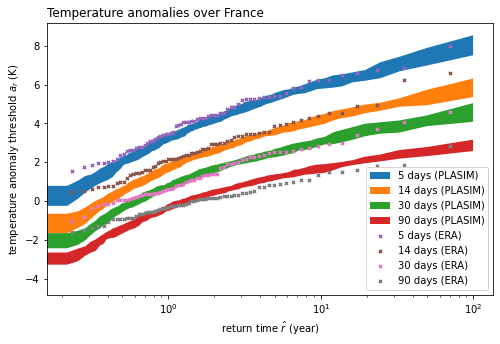

In [11]:
figure = plt.figure(1, figsize=(8, 5))
ax = figure.add_subplot(111)
BootstrapReturns(t2m.abs_area_int,'ERA','PLASIM', Tot_Mon1,area, ax,[5,14,30,90],'yes')
figure.savefig('Images/Returns_'+Model+'_'+area+'.png')

(10, 90)
(90,) (90,)


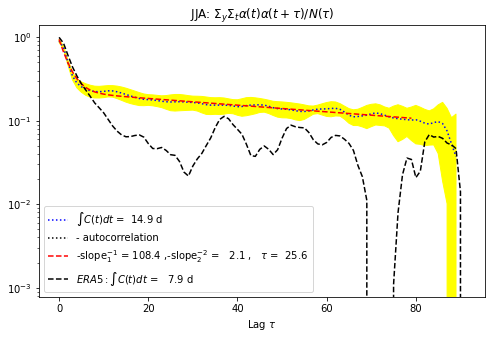

In [12]:
myfirst = [Tot_Mon1[6]]
mylast = [Tot_Mon1[9]]
myperiod_label = ['JJA']
myfiglabels = ['161']

figure = plt.figure(1, figsize=(8, 5))
for first, last, period_label, figlabels in zip(myfirst, mylast, myperiod_label, myfiglabels):
    autocorr = []
    for i in range(10):
        autocorr.append(autocorrelation(t2m.abs_area_int[i*100:(i+1)*100,first:last],last-first))
    autocorr = np.array(autocorr)/np.std(t2m.abs_area_int[i*100:(i+1)*100,first:last])**2
    print(autocorr.shape)
    autocorr_mean = np.mean(autocorr,0)
    autocorr_std = np.std(autocorr,0)
    np.save('Postproc/Plasim_'+area+'_autocorr_mean_'+period_label,autocorr_mean)
    np.save('Postproc/Plasim_'+area+'_autocorr_std_'+period_label,autocorr_std)
    print(autocorr_mean.shape,autocorr_std.shape)
    plt.fill_between(np.arange(0, len(autocorr_mean)), autocorr_mean-autocorr_std, autocorr_mean+autocorr_std,color='yellow')
    PltAutocorrelationFit(autocorr_mean,autocorr_std,0,80,ax,period_label)    
    autocorr_ERA5 = np.load('../ERA/Postproc/ERA_'+area+'_auto_corr_'+period_label+'.npy')
    plt.plot(np.arange(0, len(autocorr_ERA5)), autocorr_ERA5,'k--', label=r'$ERA5: \int C(t) dt$ = %5.1f d'%(integrate.cumtrapz(np.array(autocorr_ERA5), range(len(autocorr_ERA5)), initial=0)[-1]))
    plt.legend()
    extent = ax.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
    figure.savefig("Images/autocorelation_"+period_label+"_"+area+".png", bbox_inches=extent.expanded(1.3, 1.3))

(10, 90)
(90,) (90,)


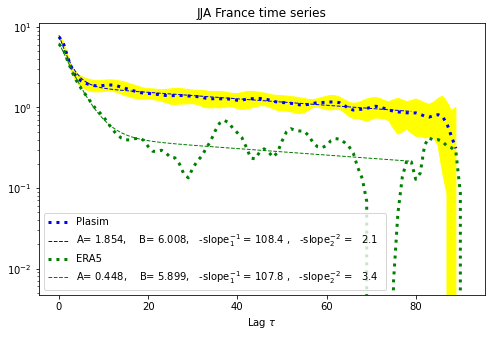

In [13]:
def PltAutocorrelationFit2(autocorr_mean,colors, linewidths, x1,x2, ax, Model):
    # Plot normalized Autocorrelation function
    plt.plot(np.arange(0, len(autocorr_mean)), autocorr_mean,colors[0], linewidth = linewidths[0], label=Model)#r'$\int C(t) dt$ = %5.1f d'%(integrate.cumtrapz(np.array(autocorr_mean), range(len(autocorr_mean)), initial=0)[-1]))
    #plt.plot(np.arange(0, len(autocorr_mean)), -autocorr_mean,'k:', label='- autocorrelation')
    
    popt1, pcov1 = curve_fit(func1, np.array(range(x1,x2)), autocorr_mean[x1:x2], p0=(1, 1e-6, 1, 1e-6))
    xaxis1 = np.arange(x1,x2)
    plt.plot(xaxis1, func1(xaxis1, *popt1), colors[1], linewidth = linewidths[1], label=r'A= %5.3f,$\quad$ B= %5.3f,$\quad$-slope$^{-1}_1$ = %5.1f ,$\quad$-slope$^{-2}_2$ = %5.1f  ' %(popt1[0],popt1[2],-popt1[1]**(-1),-popt1[3]**(-1)))
    plt.yscale("log")
    plt.xlabel(r"Lag $\tau$")



myfirst = [Tot_Mon1[6]]
mylast = [Tot_Mon1[9]]
myperiod_label = ['JJA']
myfiglabels = ['161']

figure = plt.figure(1, figsize=(8, 5))
for first, last, period_label, figlabels in zip(myfirst, mylast, myperiod_label, myfiglabels):
    autocorr = []
    for i in range(10):
        autocorr.append(autocorrelation(t2m.abs_area_int[i*100:(i+1)*100,first:last],last-first))
    autocorr = np.array(autocorr)#/np.std(t2m.abs_area_int[i*100:(i+1)*100,first:last])**2
    print(autocorr.shape)
    autocorr_mean = np.mean(autocorr,0)
    autocorr_std = np.std(autocorr,0)
    np.save('Postproc/Plasim_'+area+'_nonorm_autocorr_mean_'+period_label,autocorr_mean)
    np.save('Postproc/Plasim_'+area+'_nonorm_autocorr_std_'+period_label,autocorr_std)
    print(autocorr_mean.shape,autocorr_std.shape)
    plt.fill_between(np.arange(0, len(autocorr_mean)), autocorr_mean-autocorr_std, autocorr_mean+autocorr_std,color='yellow')
    autocorr_ERA5 = np.load('../ERA/Postproc/ERA_'+area+'_nonorm_auto_corr_'+period_label+'.npy')
    PltAutocorrelationFit2(autocorr_mean,['b:','b--'], [3, 1], 0,80,ax,Model)   
    PltAutocorrelationFit2(autocorr_ERA5,['g:','g--'], [3, 1],0,80,ax,'ERA5')   
    plt.legend()
    plt.title(period_label+" "+area+" time series")
    #extent = ax.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
    figure.savefig("Images/autocorelation_"+period_label+"_"+Model+"_"+area+".png")#, bbox_inches=extent.expanded(1.3, 1.3))

In [14]:
return_index = 1
threshold = 3.5
for T in [14]:
    print("threshold = ",yy_rt[return_index], "return = ", xx_rt[return_index])
    for myfield in [t2m, zg500]:
        print(myfield.name)
        #CompComposites(t2m.abs_area_int, myfield, T, Tot_Mon1, 1)
        CompCompositesThreshold(t2m.abs_area_int, myfield, T, Tot_Mon1, threshold)
        np.save('Postproc/'+area+'_'+myfield.name+'_composite_mean_'+str(T),myfield.composite_mean)
        np.save('Postproc/'+area+'_'+myfield.name+'_composite_std_'+str(T),myfield.composite_std)
        np.save('Postproc/'+area+'_'+myfield.name+'_composite_t_'+str(T),myfield.composite_t)

threshold =  3.466505774429866 return =  4.004096461174296
ts
A.shape =  (1000, 77)
A_max[1] =  3.599692216941288 Ti[1] =  27
A_max[5] =  3.827501901558467 Ti[5] =  46
A_max[20] =  4.630100446087973 Ti[20] =  38
A_max[26] =  4.27573789017541 Ti[26] =  15
A_max[28] =  5.147785127162933 Ti[28] =  0
A_max[29] =  3.677513922963823 Ti[29] =  21
A_max[40] =  4.579882178987775 Ti[40] =  35
A_max[51] =  4.653687170573643 Ti[51] =  72
A_max[52] =  5.14912051813943 Ti[52] =  36
A_max[57] =  3.7103982993534634 Ti[57] =  41
A_max[64] =  3.770721414259502 Ti[64] =  34
A_max[79] =  4.845825689179557 Ti[79] =  7
A_max[88] =  3.751911709351199 Ti[88] =  22
A_max[92] =  4.0458682498761585 Ti[92] =  8
A_max[93] =  3.5685031924928934 Ti[93] =  49
A_max[98] =  6.479530572891235 Ti[98] =  5
A_max[101] =  3.9422003371374945 Ti[101] =  73
A_max[106] =  4.055843458643981 Ti[106] =  21
A_max[114] =  3.5792653134890964 Ti[114] =  37
A_max[122] =  4.237236094794103 Ti[122] =  66
A_max[125] =  3.9422799093382697 

<ipython-input-15-cf0e25dc32d3>:14: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  m = Basemap(projection='nplaea',boundinglat=40,lon_0=0,resolution='c')


0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22


../ERA/ERA_Fields.py:422: UserWarning: No contour levels were found within the data range.
  c_sign = m.contour(Lon, Lat, zg_sign, levels=data_contour_level[data_contour_level.shape[0]//2:], colors=colors[3], linestyles = mylinestyles[3],linewidths=mylinewidths[3], latlon=True)   #positive significant anomalies of geopotential


23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59


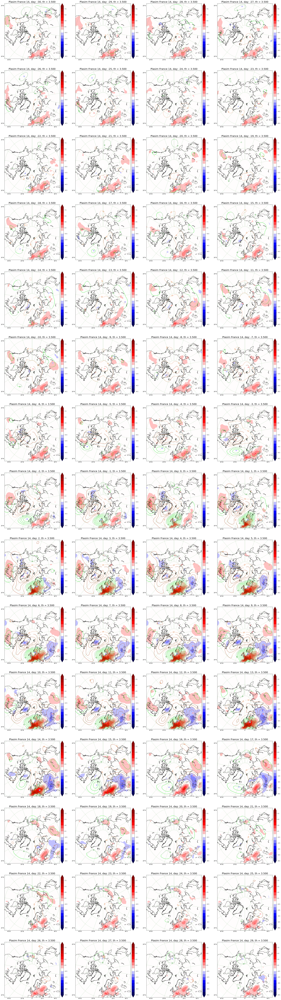

In [15]:
t_value = 2
ts_level = np.linspace(-8.5, 8.5, 18) 
zg_level = np.concatenate((np.arange(-10 * 20, 0, 10), np.arange(10, 10 * 21, 10)))
title_frame = area + '_T' + str(T) + '_' + t2m.filename + '_' + zg500.filename

import matplotlib.gridspec as gridspec
fig2 = plt.figure(figsize=(40, 150))

spec2 = gridspec.GridSpec(ncols=4, nrows=15, figure=fig2)
Nb_frame = 60
for j in range(15):
    for i in range(4):
        ax = fig2.add_subplot(spec2[j,i])
        m = Basemap(projection='nplaea',boundinglat=40,lon_0=0,resolution='c')
        myindex = (i+4*j)
        title_frame = Model+" "+area+" "+str(T)
        print(myindex)
        if myindex < Nb_frame:
            temp_sign, ts_taken = significative_data(t2m.composite_mean[myindex,:,:], t2m.composite_t[myindex,:,:], t_value, False)
            geo_contourf(m, ax, 0, Greenwich(LON), Greenwich(LAT), Greenwich(temp_sign), ts_level, "seismic", title_frame + ', day: ' + str((myindex - Nb_frame//2))+ ', th = %1.3f'%(threshold)) #r = %1.3f'%(xx_rt[return_index]))
            geo_contour_color(m, ax, 0, Greenwich(LON), Greenwich(LAT), t_value, Greenwich(zg500.composite_mean[myindex,:,:]), Greenwich(zg500.composite_t[myindex,:,:]), zg_level, ["sienna","chocolate","green","lime"],["solid","dashed","dashed","solid"],[1,1,1,1])
            PltMaxMinValue(m,Greenwich(LON), Greenwich(LAT), Greenwich(zg500.composite_mean[myindex,:,:]))
            #fig2.savefig("Images/"+Model+"_north_"+area+"_"+str(T)+"_"+str(xx_rt[return_index])+"_"+str((i+4*j)-30)+".png", bbox_inches=full_extent(ax,.25).transformed(fig2.dpi_scale_trans.inverted()))
            fig2.savefig("Images/"+Model+"_north_"+area+"_"+str(T)+"_"+str(threshold)+"_"+str((i+4*j)-30)+".png", bbox_inches=full_extent(ax,.25).transformed(fig2.dpi_scale_trans.inverted()))
#fig2.savefig("Images/CESM_"+area+"_composites.png")

In [19]:
t2m.var.shape

(1000, 150, 22, 128)